In [10]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/finalpreprocess/Final.xlsx
/kaggle/input/final-data-file-training/Final Data File_Training.xlsx


In [11]:
df = pd.read_excel("/kaggle/input/finalpreprocess/Final.xlsx")
df

,Age,Gender,Location,Income,Consumed Beer,Consumed Flavoured/Mixed Beer,Consumed Non-Alcoholic Beers,Consumed Hard Ciders,Consumed Hard Kombucha,Consumed Wine,...,Price Expectations,Purchase Likelihood,Product Consumption Frequency,Features customers liked,Features customers disliked,Concept Replacement Product,Product1 they would replace,Product2 they would replace,Product3 they would replace,OE_Quality_Flag
0,60,Female,Suburban / just outside of a city,"$150,000 or more",Yes,No,No,No,No,Yes,...,About Average,Probably Would Not Buy,Once Every 6 Months,the packaging,nothing,Be used in addition to products you are curren...,NaN,NaN,NaN,0
1,61,Male,Suburban / just outside of a city,"$20,000 to $29,999",Yes,No,No,No,No,No,...,About Average,Definitely Would Buy,Once a Month,It's a good and trusted brand.,It's seem some what generic.,Sometimes replace products you are currently d...,Heineken,Miller Lite,Budwieser,0
2,58,Male,Big city,"$70,000 to $79,999",Yes,No,No,No,No,Yes,...,About Average,Definitely Would Not Buy,Never,Just that it is a lager beer,I don't like Anheiser Busch and their values a...,Be used in addition to products you are curren...,NaN,NaN,NaN,0
3,55,Male,Suburban / just outside of a city,"$100,000 to $149,999",Yes,No,No,No,No,Yes,...,About Average,Definitely Would Buy,Two or Three Days/Nights a Week,has a less filling effect,no dislike,Sometimes replace products you are currently d...,michelob ultra,Miller light,corona,0
4,64,Male,Rural / distant or remote,"$20,000 to $29,999",Yes,Yes,No,No,No,No,...,Very Expensive,Definitely Would Buy,Once a Week,Everything,Nothing,Totally replace products you are currently dri...,Coors light,Bud,Coors,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2294,56,Male,Rural / distant or remote,"$100,000 to $149,999",Yes,No,No,Yes,No,Yes,...,Somewhat Expensive,May or May Not Buy,Once a Week,"Beer, taste funny",Looks bad,Be used in addition to products you are curren...,NaN,NaN,NaN,0
2295,39,Female,Small city,"$80,000 to $89,999",Yes,No,No,No,No,No,...,About Average,Probably Would Not Buy,Never,I like that it's made with American ingredients,It's low calorie,Be used in addition to products you are curren...,NaN,NaN,NaN,0
2296,50,Male,Suburban / just outside of a city,"$80,000 to $89,999",Yes,No,No,No,No,No,...,About Average,Probably Would Buy,Once a Week,I like the fancy bottle and the color of the beer,I dislike the price,Sometimes replace products you are currently d...,Budweiser,Coors,Miller,0
2297,57,Female,Small city,"$90,000 to $99,999",Yes,No,No,No,No,Yes,...,About Average,Probably Would Buy,Once Every 6 Months,No artificial flavors or colors and only 85 ca...,The price could be a little lower.,Be used in addition to products you are curren...,NaN,NaN,NaN,0


In [12]:
# Step 1: Handle Missing Values
df.fillna({"Features customers liked": "Unknown",
           "Features customers disliked": "Unknown",
           "Product1 they would replace": "Not specified",
           "Product2 they would replace": "Not specified",
           "Product3 they would replace": "Not specified"}, inplace=True)

# Step 2: Convert "Yes"/"No" to 1/0 for consumption-related columns
consumption_columns = [col for col in df.columns if "Consumed" in col]
df[consumption_columns] = df[consumption_columns].applymap(lambda x: 1 if x == "Yes" else 0)

# Step 3: Standardize Income Levels (convert to median income values in thousands)
income_mapping = {
    "$20,000 to $29,999": 25,
    "$70,000 to $79,999": 75,
    "$100,000 to $149,999": 125,
    "$150,000 or more": 150,
    "$30,000 to $39,999": 35,
    "$40,000 to $49,999": 45,
    "$50,000 to $59,999": 55,
    "$60,000 to $69,999": 65,
    "$80,000 to $89,999": 85,
    "$90,000 to $99,999": 95,
    "Less than $20,000": 15,
}
df["Income"] = df["Income"].map(income_mapping)

# Step 4: Encode Ordinal Variables
purchase_likelihood_mapping = {
    "Definitely Would Buy": 5,
    "Probably Would Buy": 4,
    "Might or Might Not Buy": 3,
    "Probably Would Not Buy": 2,
    "Definitely Would Not Buy": 1
}
df["Purchase Likelihood"] = df["Purchase Likelihood"].map(purchase_likelihood_mapping)

# Step 5: Drop Open-ended Text Columns if needed (not dropping for now)
df.info(), df.head()



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2299 entries, 0 to 2298
Data columns (total 33 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Age                             2299 non-null   int64  
 1   Gender                          2299 non-null   object 
 2   Location                        2299 non-null   object 
 3   Income                          2299 non-null   int64  
 4   Consumed Beer                   2299 non-null   int64  
 5   Consumed Flavoured/Mixed Beer   2299 non-null   int64  
 6   Consumed Non-Alcoholic Beers    2299 non-null   int64  
 7   Consumed Hard Ciders            2299 non-null   int64  
 8   Consumed Hard Kombucha          2299 non-null   int64  
 9   Consumed Wine                   2299 non-null   int64  
 10  Consumed Hard Beverage          2299 non-null   int64  
 11  Consumed Distilled Spirits      2299 non-null   int64  
 12  Consumed Domestic Light Beer    22

<ipython-input-12-f4b263129b42>:10: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df[consumption_columns] = df[consumption_columns].applymap(lambda x: 1 if x == "Yes" else 0)


(None,
    Age  Gender                           Location  Income  Consumed Beer  \
 0   60  Female  Suburban / just outside of a city     150              1   
 1   61    Male  Suburban / just outside of a city      25              1   
 2   58    Male                           Big city      75              1   
 3   55    Male  Suburban / just outside of a city     125              1   
 4   64    Male          Rural / distant or remote      25              1   
 
    Consumed Flavoured/Mixed Beer  Consumed Non-Alcoholic Beers  \
 0                              0                             0   
 1                              0                             0   
 2                              0                             0   
 3                              0                             0   
 4                              1                             0   
 
    Consumed Hard Ciders  Consumed Hard Kombucha  Consumed Wine  ...  \
 0                     0                       0     

In [14]:
from sklearn.preprocessing import StandardScaler

# Step 1: Handle Missing Values
df.fillna("Unknown", inplace=True)  # Replace NaNs with "Unknown" for categorical columns

# Step 2: Convert Categorical Columns using One-Hot Encoding
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()
df_encoded = pd.get_dummies(df, columns=categorical_columns, drop_first=True)

# Step 3: Normalize Numerical Columns
numerical_columns = df_encoded.select_dtypes(include=['int64', 'float64']).columns.tolist()
scaler = StandardScaler()
df_encoded[numerical_columns] = scaler.fit_transform(df_encoded[numerical_columns])

# Step 4: Check for Correlations and Remove Highly Correlated Features (Threshold > 0.9)
correlation_matrix = df_encoded.corr().abs()
upper_tri = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]
df_processed = df_encoded.drop(columns=to_drop)

# Display processed dataset info and first few rows
df_processed.info(), df_processed.head()


<ipython-input-14-74197eb298d4>:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Unknown' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.fillna("Unknown", inplace=True)  # Replace NaNs with "Unknown" for categorical columns


KeyboardInterrupt: 

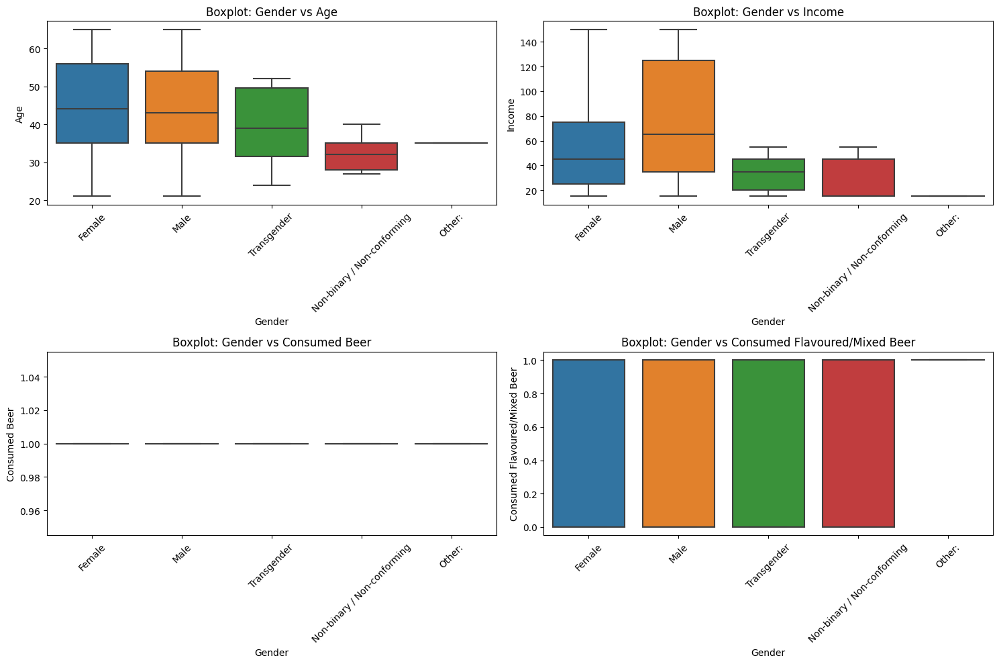

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Identify qualitative (categorical) and quantitative (numerical) columns
qualitative_cols = df.select_dtypes(include=['object']).columns.tolist()
quantitative_cols = df_encoded.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Create boxplots to visualize relationships
plt.figure(figsize=(15, 10))
for i, num_col in enumerate(quantitative_cols[:4]):  # Limit to first 4 numerical columns for clarity
    plt.subplot(2, 2, i+1)
    sns.boxplot(x=df[qualitative_cols[0]], y=df[num_col])  # Compare first categorical variable
    plt.xticks(rotation=45)
    plt.title(f"Boxplot: {qualitative_cols[0]} vs {num_col}")

plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


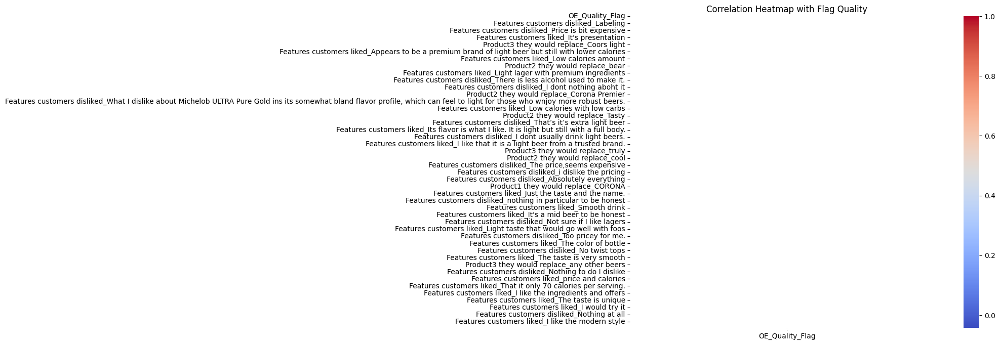

In [17]:
# Check if "Flag Quality" exists in the dataset
flag_quality_col = "OE_Quality_Flag"  # Adjust if the column name differs

if flag_quality_col in df_encoded.columns:
    # Compute correlations with "Flag Quality"
    correlation_with_flag = df_encoded.corr()[flag_quality_col].sort_values(ascending=False)

    # Plot heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_with_flag.to_frame(), annot=True, cmap="coolwarm", linewidths=2)
    plt.title("Correlation Heatmap with Flag Quality")
    plt.show()
else:
    print("Column 'Flag Quality' not found. Please check the dataset.")


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

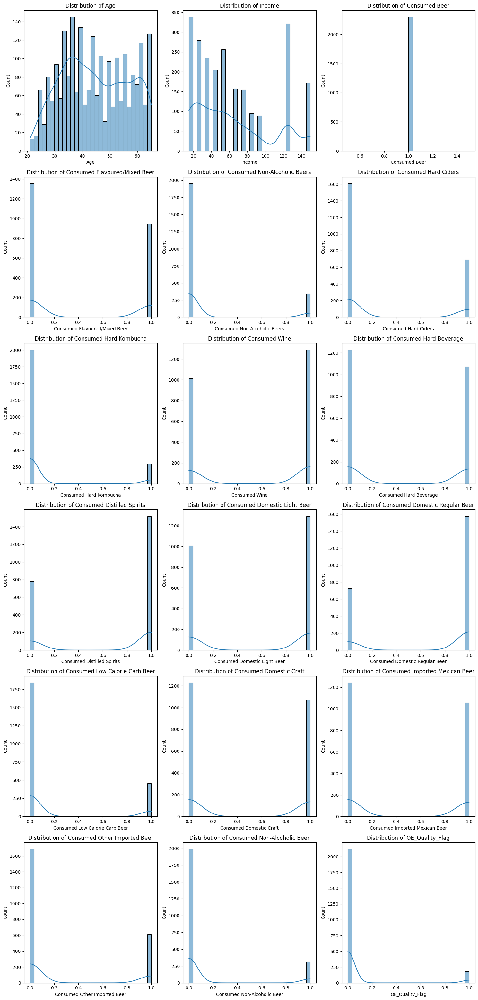

<ipython-input-27-1256030ff12e>:39: UserWarning: Glyph 129315 (\N{ROLLING ON THE FLOOR LAUGHING}) missing from current font.
  plt.tight_layout()
<ipython-input-27-1256030ff12e>:39: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129315 (\N{ROLLING ON THE FLOOR LAUGHING}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


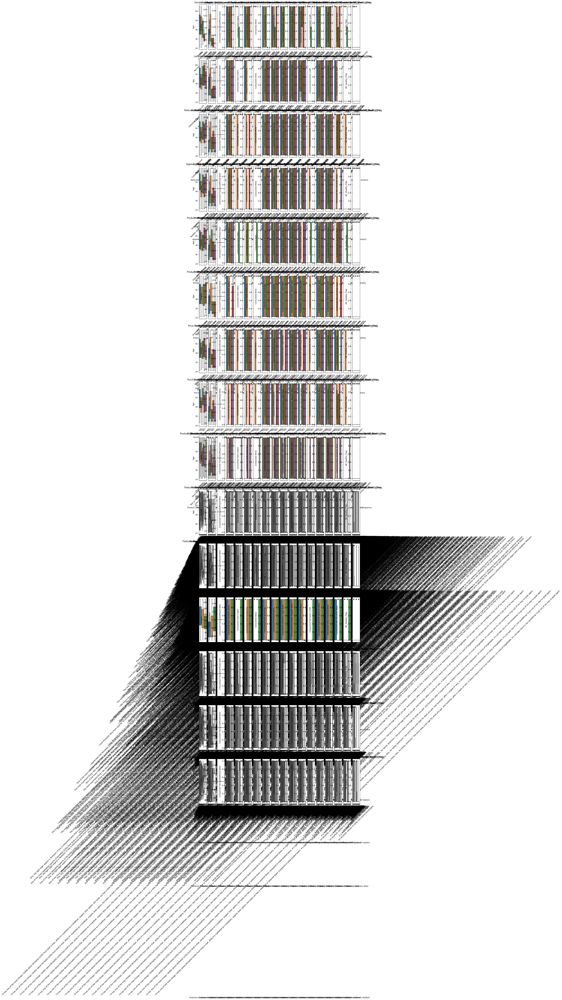

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

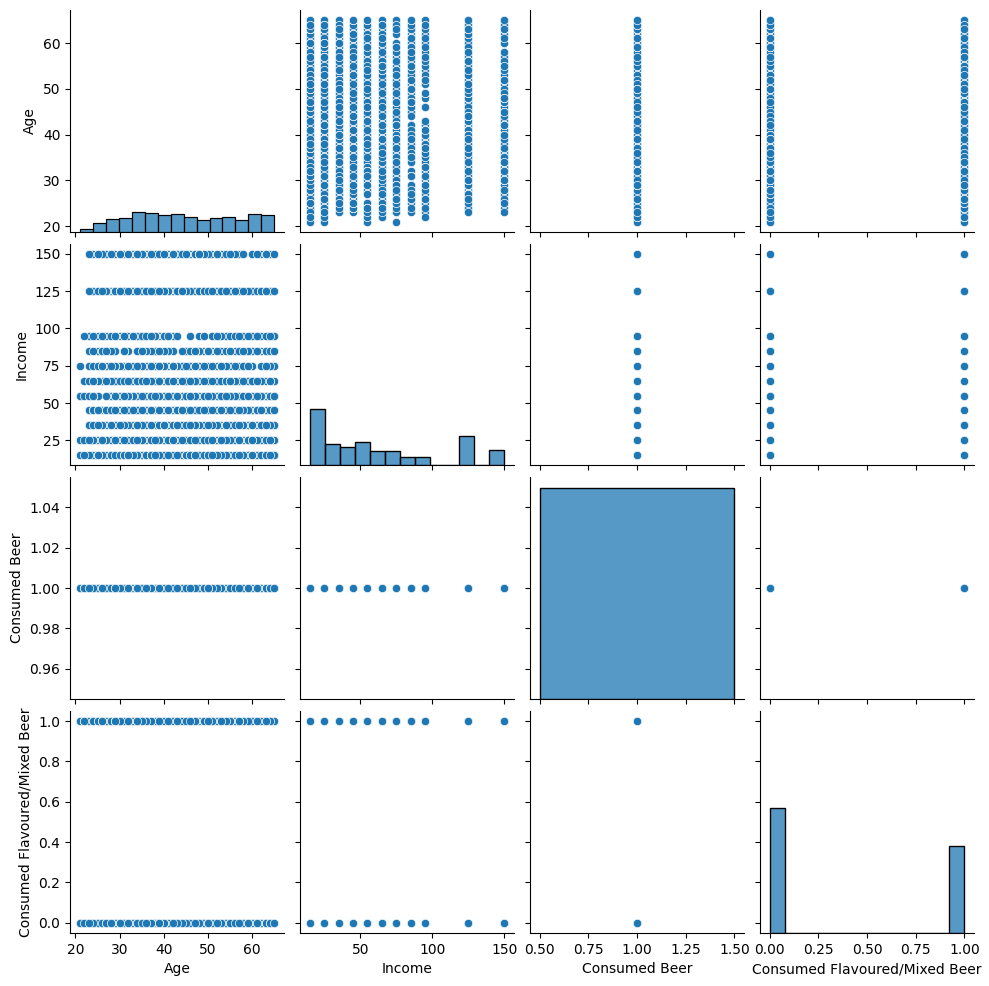

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


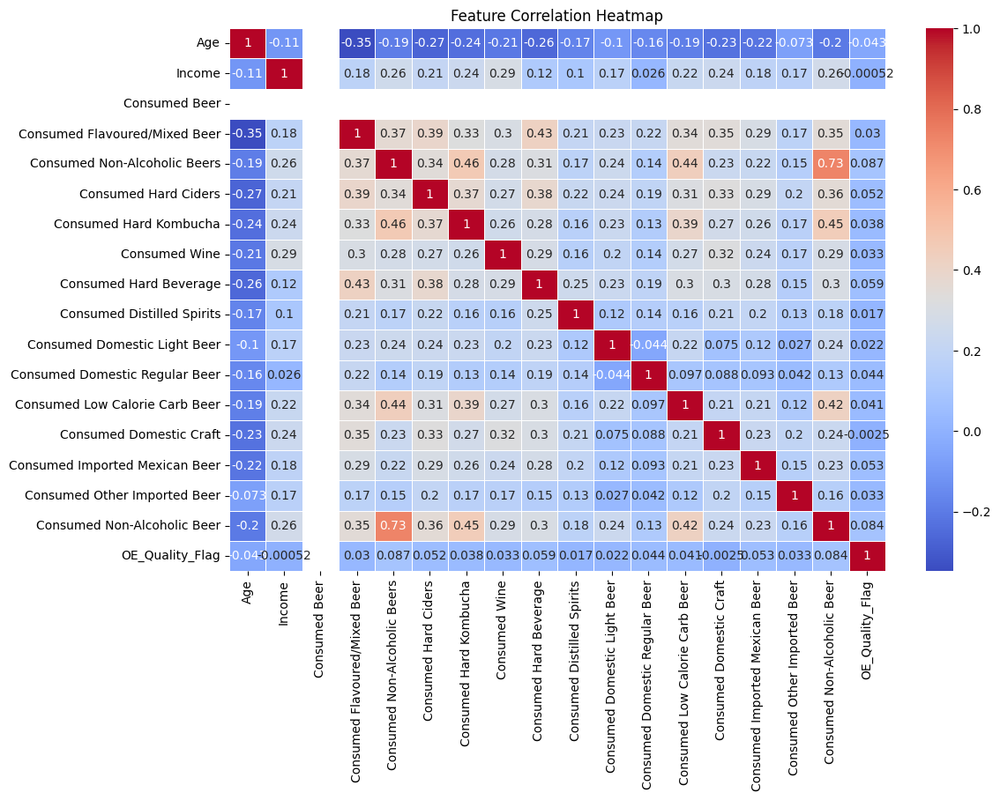

<ipython-input-27-1256030ff12e>:61: UserWarning: Glyph 129315 (\N{ROLLING ON THE FLOOR LAUGHING}) missing from current font.
  plt.tight_layout()
<ipython-input-27-1256030ff12e>:61: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129315 (\N{ROLLING ON THE FLOOR LAUGHING}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


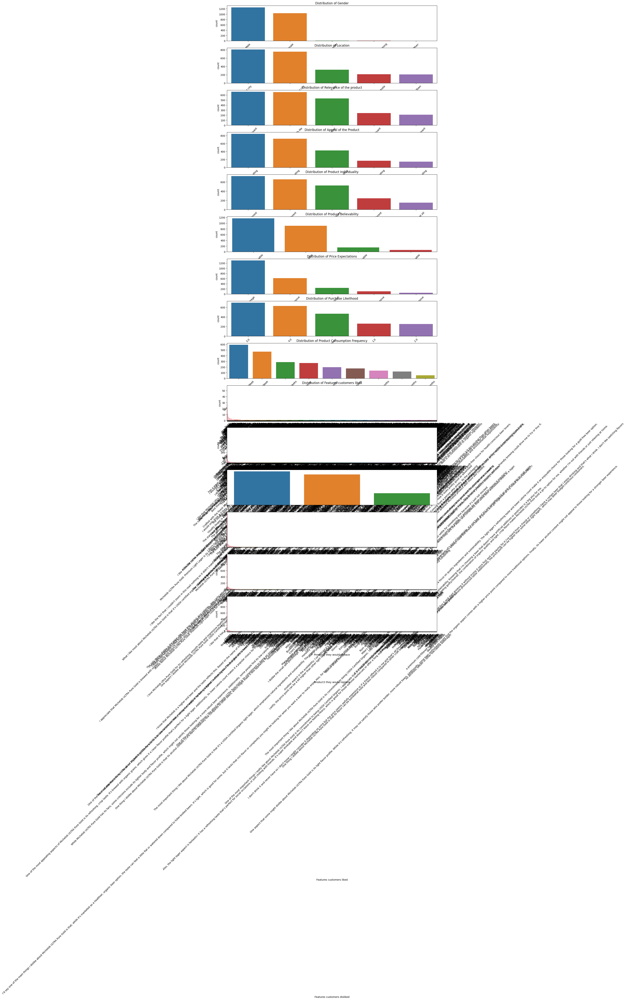

<ipython-input-27-1256030ff12e>:75: UserWarning: Glyph 129315 (\N{ROLLING ON THE FLOOR LAUGHING}) missing from current font.
  plt.tight_layout()
<ipython-input-27-1256030ff12e>:75: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129315 (\N{ROLLING ON THE FLOOR LAUGHING}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


In [ ]:
# Re-import necessary libraries
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Identify numerical and categorical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

# Ensure selected numerical columns exist in the dataset
selected_numerical = [col for col in numerical_columns if col in df.columns]

# Ensure selected categorical columns exist in the dataset
selected_categorical = [col for col in categorical_columns if col in df.columns]

# ------------------------- 1. HISTOGRAMS & KDE PLOTS (Distribution of Numerical Features) ------------------------- #
plt.figure(figsize=(15, len(selected_numerical) * 2))
for i, col in enumerate(selected_numerical):
    plt.subplot((len(selected_numerical) // 3) + 1, 3, i+1)  # Auto-adjust rows
    sns.histplot(df[col].dropna(), bins=30, kde=True)
    plt.title(f"Distribution of {col}")
df.replace([np.inf, -np.inf], np.nan, inplace=True)


plt.tight_layout()
plt.show()

# ------------------------- 2. BOXPLOTS (Categorical vs Numerical Features) ------------------------- #
plt.figure(figsize=(15, 5 * len(selected_categorical)))
plot_index = 1
for cat_col in selected_categorical:
    for num_col in selected_numerical:
        plt.subplot(len(selected_categorical), len(selected_numerical), plot_index)
        sns.boxplot(x=df[cat_col], y=df[num_col].dropna())
        plt.xticks(rotation=45)
        plt.title(f"{cat_col} vs {num_col}")
        plot_index += 1

plt.tight_layout()
plt.show()

# ------------------------- 3. SCATTER PLOTS (Numerical Relationships) ------------------------- #
if len(selected_numerical) >= 4:
    sns.pairplot(df[selected_numerical[:4]].dropna())  # Select first 4 numerical columns
    plt.show()

# ------------------------- 4. HEATMAP (Feature Correlations) ------------------------- #
plt.figure(figsize=(12, 8))
sns.heatmap(df[selected_numerical].corr(), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

# ------------------------- 5. BAR CHARTS (Categorical Distribution) ------------------------- #
plt.figure(figsize=(15, len(selected_categorical) * 3))
for i, col in enumerate(selected_categorical):
    plt.subplot(len(selected_categorical), 1, i+1)
    sns.countplot(x=df[col], order=df[col].value_counts().index)
    plt.xticks(rotation=45)
    plt.title(f"Distribution of {col}")

plt.tight_layout()
plt.show()

# ------------------------- 6. VIOLIN PLOTS (Density & Distribution Combined) ------------------------- #
plt.figure(figsize=(15, 5 * len(selected_categorical)))
plot_index = 1
for cat_col in selected_categorical:
    for num_col in selected_numerical:
        plt.subplot(len(selected_categorical), len(selected_numerical), plot_index)
        sns.violinplot(x=df[cat_col], y=df[num_col].dropna())
        plt.xticks(rotation=45)
        plt.title(f"{cat_col} vs {num_col}")
        plot_index += 1

plt.tight_layout()
plt.show()
